##**Notebook PC#08**
## Simple Recurrent Neural Network, Linear Predictor, MLP and LSTM for multi-step time series prediction.<BR>

**Professor:** Fernando J. Von Zuben <br>
**Aluno(a):** Taylon Luan Congio Martins RA: 177379<br>
**Aluno(a):** Tiago C A Amorim RA: 100675

In [ ]:
# Loading all the relevant libraries
from pandas import read_csv
from pandas import DataFrame
import numpy as np
import pandas as pd
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, SimpleRNN, LSTM, GRU
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import math
import matplotlib.pyplot as plt

## **A base [unemployment rate] foi baixada no [link](https://fred.stlouisfed.org/series/UNRATE).**

In [ ]:
# Structuring the dataset from a single time series, scaling and spliting into training / testing
def get_train_test(dataset, split_percent, time_steps, horizon):
    df = read_csv(dataset, usecols=[1], engine='python')
    data = np.array(df.values.astype('float32'))
    scaler = MinMaxScaler(feature_range=(0, 1))
    # There is a kind of data leakage in the next command
    data = scaler.fit_transform(data).flatten()
    n = len(data)
    df = DataFrame()
    for i in range(0,time_steps):
      df['t-' + str(time_steps-i-1)] = [data[j] for j in range(i, (len(data)-horizon-time_steps+i+1))]
    for i in range(1,horizon+1):
      df['t+' + str(i)] = [data[j] for j in range(time_steps+i-1, (len(data)-horizon+i))]
    print(df)
    df1 = df.copy()
    for i in range(1,horizon+1):
      df1 = df1.drop(['t+' + str(i)], axis = 1)
    dataX = np.array(df1) #separacao de dados de time_steps
    df2 = df['t+1']
    for i in range(2,horizon+1):
      df2 = pd.concat([df2, df['t+' + str(i)]], axis=1)
    datay = np.array(df2) #separacao de dados de horizon
    # Point for splitting data into train and test
    split = int(n*split_percent)
    X = dataX[range(split),:]
    y = datay[range(split)]
    Xt = dataX[split:,:]
    yt = datay[split:]
    return X, y, Xt, yt

time_steps = 11
horizon = 3
# Here you will decide which dataset to consider.
X, y, Xt, yt = get_train_test('unemployment_rate.csv', 0.8, time_steps, horizon)
#X, y, Xt, yt = get_train_test('monthly_sunspot.csv', 0.8, time_steps, horizon)

         t-10       t-9       t-8       t-7       t-6       t-5       t-4  \
0    0.073171  0.105691  0.121951  0.113821  0.081301  0.089431  0.089431   
1    0.105691  0.121951  0.113821  0.081301  0.089431  0.089431  0.113821   
2    0.121951  0.113821  0.081301  0.089431  0.089431  0.113821  0.105691   
3    0.113821  0.081301  0.089431  0.089431  0.113821  0.105691  0.097561   
4    0.081301  0.089431  0.089431  0.113821  0.105691  0.097561  0.105691   
..        ...       ...       ...       ...       ...       ...       ...   
897  0.089431  0.089431  0.081301  0.073171  0.089431  0.081301  0.073171   
898  0.089431  0.081301  0.073171  0.089431  0.081301  0.073171  0.097561   
899  0.081301  0.073171  0.089431  0.081301  0.073171  0.097561  0.089431   
900  0.073171  0.089431  0.081301  0.073171  0.097561  0.089431  0.081301   
901  0.089431  0.081301  0.073171  0.097561  0.089431  0.081301  0.105691   

          t-3       t-2       t-1       t-0       t+1       t+2       t+3  

In [ ]:
print(X.shape)
print(y.shape)

(732, 11)
(732, 3)


## **Implementing the simple recurrent neural network**

In [ ]:
# Execute this cell or the cell associated with one of the other predictors. They are mutually exclusive.
def create_RNN(hidden_units, dense_units, input_shape, activation):
        model = Sequential()
        model.add(SimpleRNN(hidden_units, activation=activation[0], input_shape=input_shape))
        model.add(Dense(units=dense_units, activation=activation[1]))
        model.compile(loss='mean_squared_error', optimizer='adam')
        return model

def RNN_predictor (X, y, time_steps):
    model = create_RNN(hidden_units=30, dense_units=horizon, input_shape=(time_steps,1), activation=['tanh', 'tanh'])
    train_predict = model.fit(X, y, epochs=20, batch_size=1, verbose=2)
    return model

RNN_model = RNN_predictor(X, y, time_steps)

Epoch 1/20
732/732 - 6s - loss: 0.0051 - 6s/epoch - 9ms/step
Epoch 2/20
732/732 - 2s - loss: 0.0013 - 2s/epoch - 3ms/step
Epoch 3/20
732/732 - 2s - loss: 0.0010 - 2s/epoch - 2ms/step
Epoch 4/20
732/732 - 2s - loss: 9.0324e-04 - 2s/epoch - 3ms/step
Epoch 5/20
732/732 - 2s - loss: 8.6682e-04 - 2s/epoch - 3ms/step
Epoch 6/20
732/732 - 2s - loss: 7.8694e-04 - 2s/epoch - 2ms/step
Epoch 7/20
732/732 - 2s - loss: 7.4251e-04 - 2s/epoch - 2ms/step
Epoch 8/20
732/732 - 2s - loss: 7.4456e-04 - 2s/epoch - 2ms/step
Epoch 9/20
732/732 - 2s - loss: 7.5103e-04 - 2s/epoch - 2ms/step
Epoch 10/20
732/732 - 2s - loss: 7.1980e-04 - 2s/epoch - 2ms/step
Epoch 11/20
732/732 - 2s - loss: 7.1989e-04 - 2s/epoch - 3ms/step
Epoch 12/20
732/732 - 3s - loss: 7.3917e-04 - 3s/epoch - 4ms/step
Epoch 13/20
732/732 - 2s - loss: 7.1817e-04 - 2s/epoch - 2ms/step
Epoch 14/20
732/732 - 2s - loss: 7.0561e-04 - 2s/epoch - 2ms/step
Epoch 15/20
732/732 - 2s - loss: 7.6748e-04 - 2s/epoch - 2ms/step
Epoch 16/20
732/732 - 2s - loss

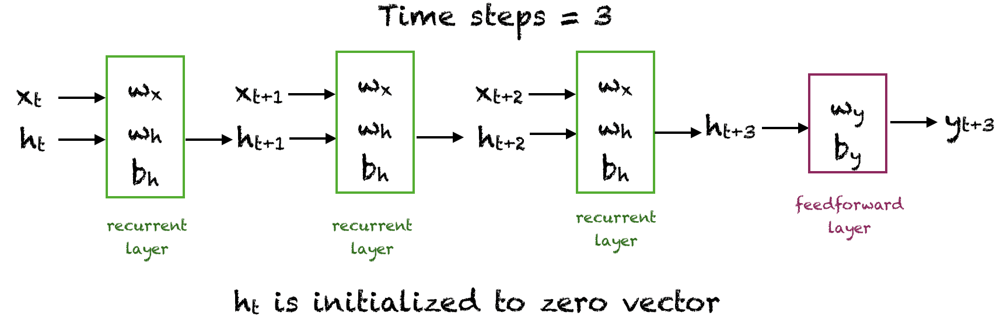

In [ ]:
# [Do not run this cell] or [Upload the PNG file and then run].
# Configuration of the simple RNN
from IPython.display import Image
Image("RNN_info_flow.png", width = 600, height = 300)

In [ ]:
wx = RNN_model.get_weights()[0]
wh = RNN_model.get_weights()[1]
bh = RNN_model.get_weights()[2]
wy = RNN_model.get_weights()[3]
by = RNN_model.get_weights()[4]
print(wx.shape)
print(wh.shape)
print(bh.shape)
print(wy.shape)
print(by.shape)

(1, 30)
(30, 30)
(30,)
(30, 3)
(3,)


## **Implementing a linear predictor**

In [ ]:
# Execute this cell or the cell associated with one of the other predictors. They are mutually exclusive.
def linear_predictor(X,y):
    model = LinearRegression()
    train_predict = model.fit(X, y)
    print(model.coef_)
    print(model.intercept_)

    return model

linear_model = linear_predictor(X,y)

[[ 0.11851811 -0.12171889 -0.02107678  0.05709181 -0.03613607 -0.1277338
   0.03432588 -0.0803625  -0.07273654  0.2400809   0.9935694 ]
 [ 0.07581855  0.04241052 -0.134515    0.02920142  0.01571846 -0.15734799
  -0.09819799 -0.0460189  -0.15392885  0.16570777  1.2284961 ]
 [ 0.21077284 -0.12918374 -0.00265026 -0.06813775 -0.01591381 -0.13397385
  -0.10556133 -0.18870555 -0.14540194  0.13890208  1.3892753 ]]
[0.00447309 0.008991   0.01394928]


## **Implementing the multilayer perceptron neural network (MLP)**

In [ ]:
# Execute this cell or the cell associated with one of the other predictors. They are mutually exclusive.
def MLP_predictor():
  model = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(80, activation=tf.nn.tanh),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(horizon, activation='linear')
  ])
  model.compile(optimizer='adam', loss='mean_squared_error')
  train_predict = model.fit(X, y, epochs=100)
  model.summary()

  return model

MLP_model = MLP_predictor()

Epoch 1/100
23/23 [==============================] - 1s 2ms/step - loss: 0.0663
Epoch 2/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0248
Epoch 3/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0163
Epoch 4/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0147
Epoch 5/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0127
Epoch 6/100
23/23 [==============================] - 0s 3ms/step - loss: 0.0111
Epoch 7/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0087
Epoch 8/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0072
Epoch 9/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0063
Epoch 10/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0056
Epoch 11/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0047
Epoch 12/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0042
Epoch 13/100
23/23 [=================

## **Implementing the long short-term memory network (LSTM)**

In [ ]:
def LSTM_predictor(X, y, time_steps):
    X1 = X.reshape(X.shape[0],time_steps,1)
    model=Sequential()
    model.add(LSTM(25,input_shape=(time_steps,1)))
    model.add(Dense(horizon,activation='linear'))
    model.compile(loss='mean_squared_error',optimizer='adam')

    train_predict = model.fit(X1,y,epochs=200,verbose=2)

    return model

LSTM_model = LSTM_predictor(X, y, time_steps)
print(LSTM_model.summary())

Epoch 1/200
23/23 - 2s - loss: 0.0369 - 2s/epoch - 93ms/step
Epoch 2/200
23/23 - 0s - loss: 0.0071 - 169ms/epoch - 7ms/step
Epoch 3/200
23/23 - 0s - loss: 0.0050 - 170ms/epoch - 7ms/step
Epoch 4/200
23/23 - 0s - loss: 0.0043 - 166ms/epoch - 7ms/step
Epoch 5/200
23/23 - 0s - loss: 0.0038 - 171ms/epoch - 7ms/step
Epoch 6/200
23/23 - 0s - loss: 0.0036 - 170ms/epoch - 7ms/step
Epoch 7/200
23/23 - 0s - loss: 0.0033 - 175ms/epoch - 8ms/step
Epoch 8/200
23/23 - 0s - loss: 0.0032 - 166ms/epoch - 7ms/step
Epoch 9/200
23/23 - 0s - loss: 0.0032 - 172ms/epoch - 7ms/step
Epoch 10/200
23/23 - 0s - loss: 0.0030 - 176ms/epoch - 8ms/step
Epoch 11/200
23/23 - 0s - loss: 0.0029 - 165ms/epoch - 7ms/step
Epoch 12/200
23/23 - 0s - loss: 0.0027 - 167ms/epoch - 7ms/step
Epoch 13/200
23/23 - 0s - loss: 0.0025 - 176ms/epoch - 8ms/step
Epoch 14/200
23/23 - 0s - loss: 0.0024 - 178ms/epoch - 8ms/step
Epoch 15/200
23/23 - 0s - loss: 0.0022 - 172ms/epoch - 7ms/step
Epoch 16/200
23/23 - 0s - loss: 0.0021 - 168ms/epoc

In [ ]:
def print_error(trainY, testY, train_predict, test_predict,i):
    # Error of predictions
    train_rmse = math.sqrt(mean_squared_error(trainY, train_predict))
    test_rmse = math.sqrt(mean_squared_error(testY, test_predict))
    # Print RMSE
    print('t+%d RMSE train: %.3f RMSE' % (i+1, train_rmse))
    print('t+%d RMSE test: %.3f RMSE' % (i+1, test_rmse))
    return [train_rmse, test_rmse]


def RMSE(train_predict, test_predict):
  rmse = []
  for i in range(horizon):
    if(horizon == 1):
      y1_pred = train_predict
      y1_pred_t = test_predict
      y1 = y
      y1_t = yt
    elif(horizon > 1):
      y1_pred = train_predict[:,i]
      y1_pred_t = test_predict[:,i]
      y1 = y[:,i]
      y1_t = yt[:,i]

    erro = print_error(y1, y1_t, y1_pred, y1_pred_t,i)
    rmse.append(erro)

  # Create a DataFrame from the rmse values for each horizon
  df = pd.DataFrame(rmse)
  df.columns = ['train', 'test']
  return df


In [ ]:
# Plot the predictions together with the actual values
def plot_result(trainY, testY, train_predict, test_predict,i):
    actual = np.append(trainY, testY)
    predictions = np.append(train_predict, test_predict)
    rows = len(actual)
    plt.figure(figsize=(30, 6), dpi=300)
    plt.plot(range(rows), actual)
    plt.plot(range(rows), predictions)
    plt.axvline(x=len(trainY), color='r')
    plt.legend(['Actual', 'Predictions'])
    plt.xlabel('Time steps')
    plt.ylabel('Actual and Predicted Values')
    plt.title('t+%d Predition (The Red Line Separates The Training And Test Examples)' % (i+1))
    plt.grid(True)

def plot_predict(train_predict, test_predict, y, yt):
  for i in range(horizon):
    if(horizon == 1):
      y1_pred = train_predict
      y1_pred_t = test_predict
      y1 = y
      y1_t = yt
    elif(horizon > 1):
      y1_pred = train_predict[:,i]
      y1_pred_t = test_predict[:,i]
      y1 = y[:,i]
      y1_t = yt[:,i]
    plot_result(y1, y1_t, y1_pred, y1_pred_t,i)


***** RNN MODEL *****
6/6 [==============================] - 0s 4ms/step
t+1 RMSE train: 0.019 RMSE
t+1 RMSE test: 0.068 RMSE
t+2 RMSE train: 0.025 RMSE
t+2 RMSE test: 0.094 RMSE
t+3 RMSE train: 0.033 RMSE
t+3 RMSE test: 0.111 RMSE


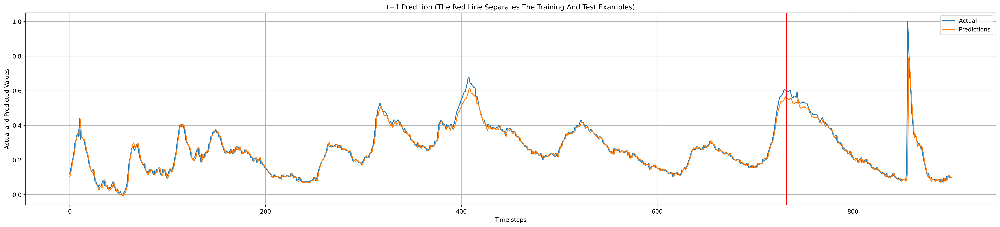

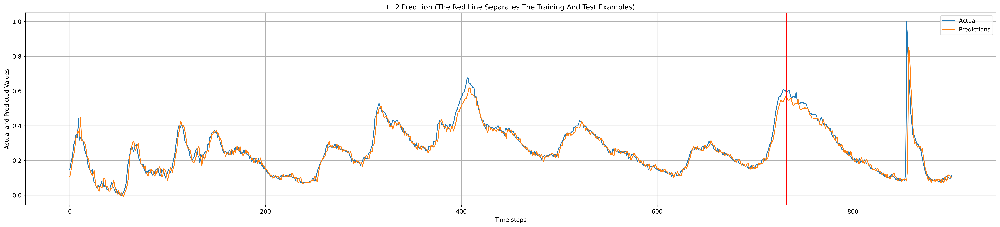

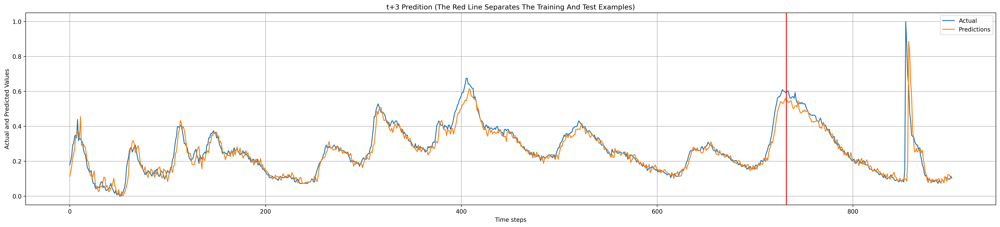

In [ ]:
print ('***** RNN MODEL *****')
train_predict = RNN_model.predict(X)
test_predict = RNN_model.predict(Xt)
df1 = RMSE(train_predict, test_predict)
plot_predict(train_predict, test_predict, y, yt)

***** LINEAR MODEL *****
t+1 RMSE train: 0.016 RMSE
t+1 RMSE test: 0.077 RMSE
t+2 RMSE train: 0.022 RMSE
t+2 RMSE test: 0.114 RMSE
t+3 RMSE train: 0.030 RMSE
t+3 RMSE test: 0.141 RMSE


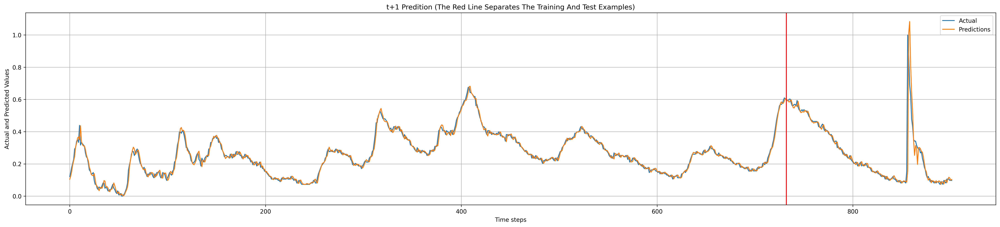

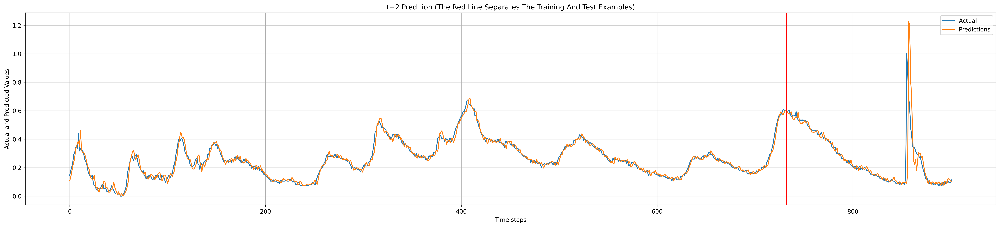

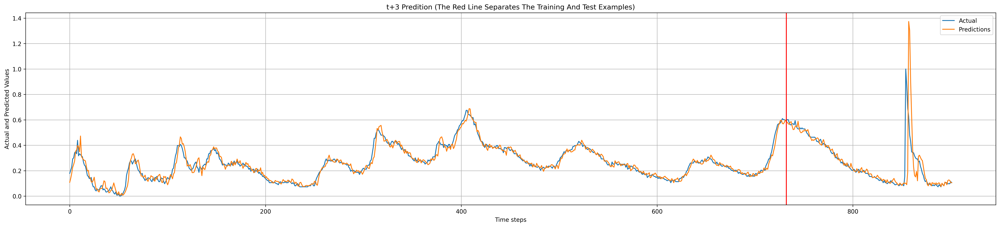

In [ ]:
print ('***** LINEAR MODEL *****')
train_predict = linear_model.predict(X)
test_predict = linear_model.predict(Xt)
df2 = RMSE(train_predict, test_predict)
plot_predict(train_predict, test_predict, y, yt)

***** MLP MODEL *****
6/6 [==============================] - 0s 2ms/step
t+1 RMSE train: 0.021 RMSE
t+1 RMSE test: 0.086 RMSE
t+2 RMSE train: 0.024 RMSE
t+2 RMSE test: 0.114 RMSE
t+3 RMSE train: 0.034 RMSE
t+3 RMSE test: 0.142 RMSE


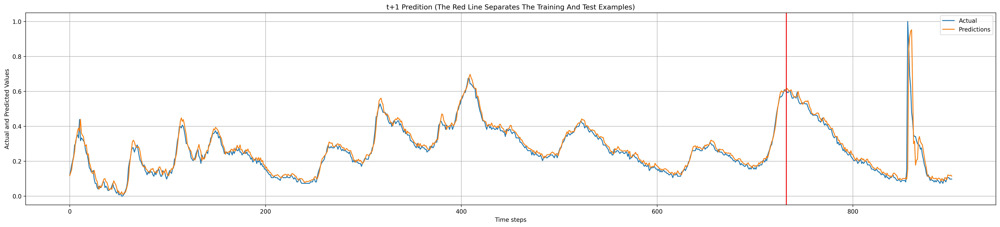

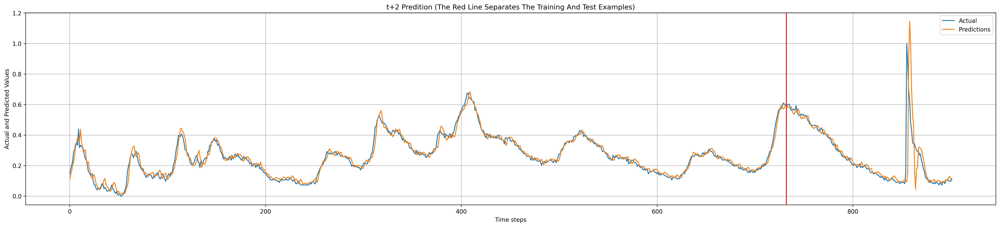

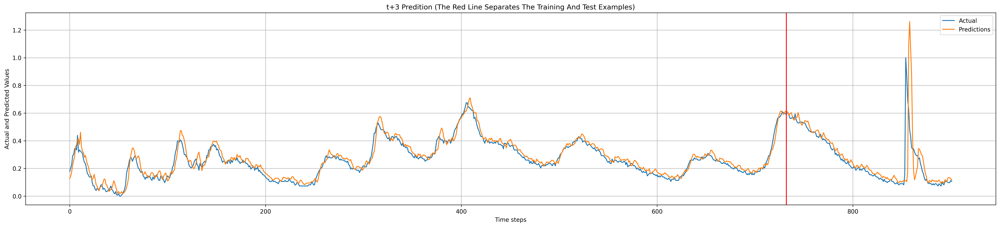

In [ ]:
print ('***** MLP MODEL *****')
train_predict = MLP_model.predict(X)
test_predict = MLP_model.predict(Xt)
df3 = RMSE(train_predict, test_predict)
plot_predict(train_predict, test_predict, y, yt)

***** LSTM MODEL *****
6/6 [==============================] - 0s 3ms/step
t+1 RMSE train: 0.018 RMSE
t+1 RMSE test: 0.083 RMSE
t+2 RMSE train: 0.025 RMSE
t+2 RMSE test: 0.114 RMSE
t+3 RMSE train: 0.032 RMSE
t+3 RMSE test: 0.139 RMSE


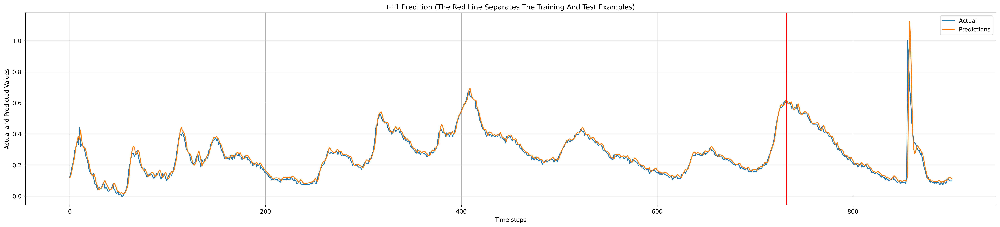

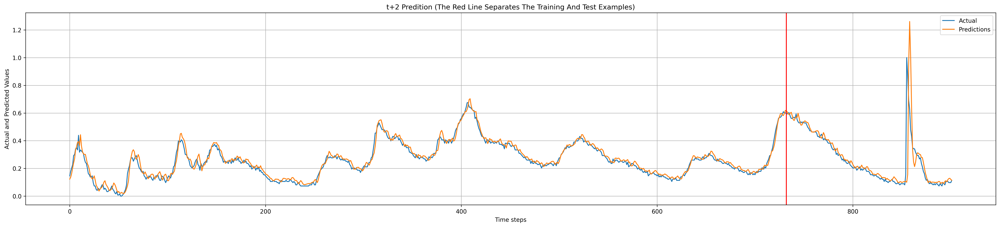

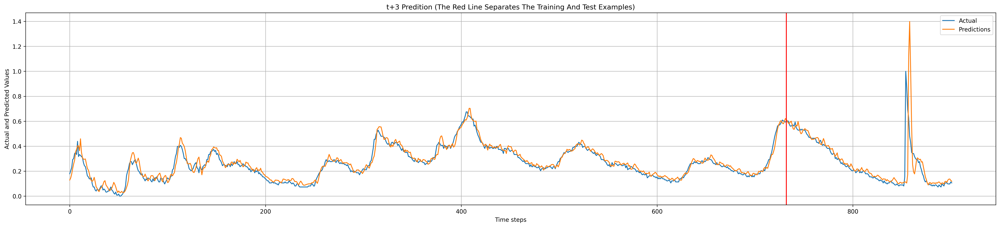

In [ ]:
print ('***** LSTM MODEL *****')
train_predict = LSTM_model.predict(X)
test_predict = LSTM_model.predict(Xt)
df4 = RMSE(train_predict, test_predict)
plot_predict(train_predict, test_predict, y, yt)

In [ ]:
# Plot the prediction error
def plot_result2(trainY, testY, train_predict, test_predict,i):
    actual = np.append(trainY, testY)
    predictions = np.append(train_predict, test_predict)
    rows = len(actual)
    plt.figure(figsize=(30, 6), dpi=300)
    plt.plot(range(rows), actual - predictions)
    plt.axvline(x=len(trainY), color='r')
    plt.xlabel('Time steps')
    plt.ylabel('Actual minus Predicted Values')
    plt.title('t+%d Predition Error (The Red Line Separates The Training And Test Examples)' % (i+1))
    plt.ylim(-0.5, +1.0) # Please, set the interval appropriately, considering all the graphs.
    plt.grid(True)

def plot_error_predict(train_predict, test_predict, y, yt):
    for i in range(horizon):
      if(horizon == 1):
        y1_pred = train_predict
        y1_pred_t = test_predict
        y1 = y
        y1_t = yt
      elif(horizon > 1):
        y1_pred = train_predict[:,i]
        y1_pred_t = test_predict[:,i]
        y1 = y[:,i]
        y1_t = yt[:,i]
      plot_result2(y1, y1_t, y1_pred, y1_pred_t,i)

***** RNN MODEL *****
6/6 [==============================] - 0s 3ms/step


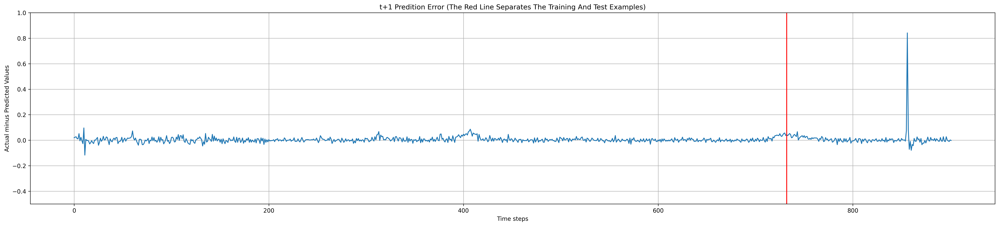

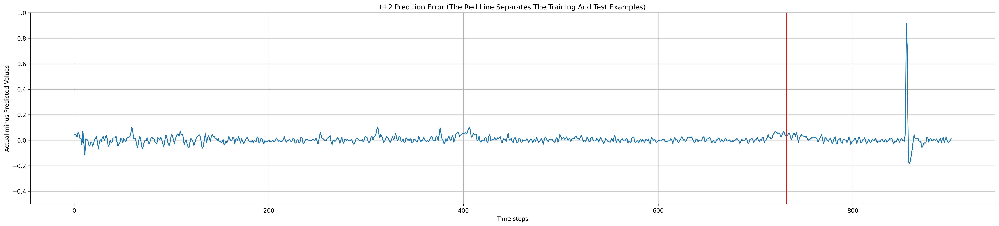

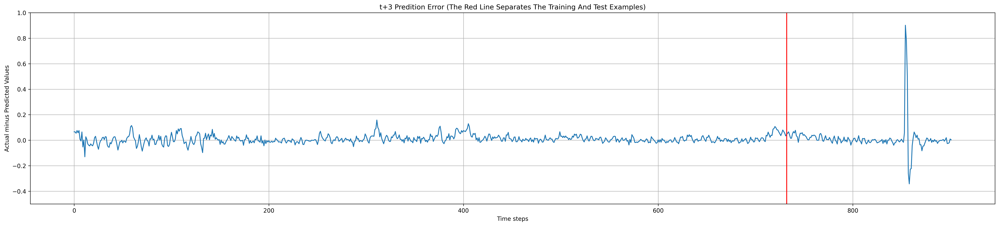

In [ ]:
print ('***** RNN MODEL *****')
train_predict = RNN_model.predict(X)
test_predict = RNN_model.predict(Xt)
plot_error_predict(train_predict, test_predict, y, yt)


***** LINEAR MODEL *****


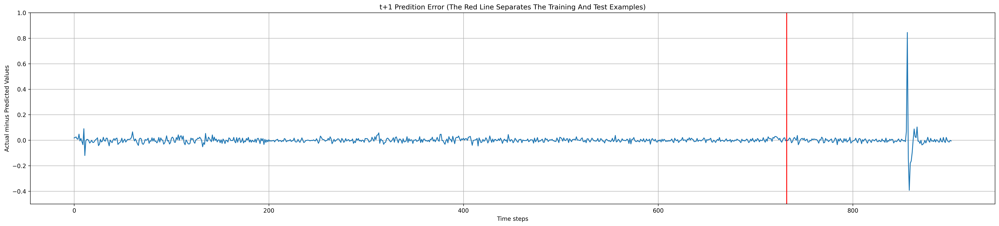

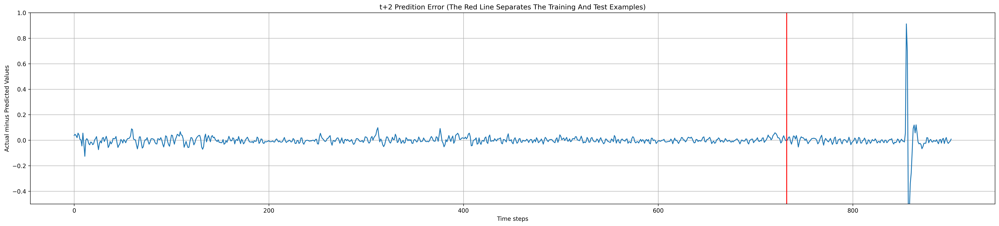

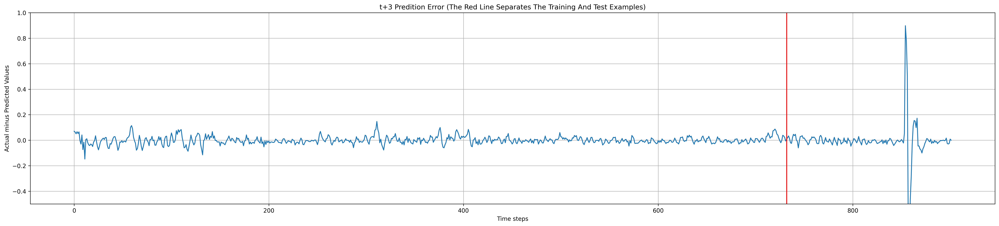

In [ ]:
print ('***** LINEAR MODEL *****')
train_predict = linear_model.predict(X)
test_predict = linear_model.predict(Xt)
plot_error_predict(train_predict, test_predict, y, yt)

***** MLP MODEL *****
6/6 [==============================] - 0s 2ms/step


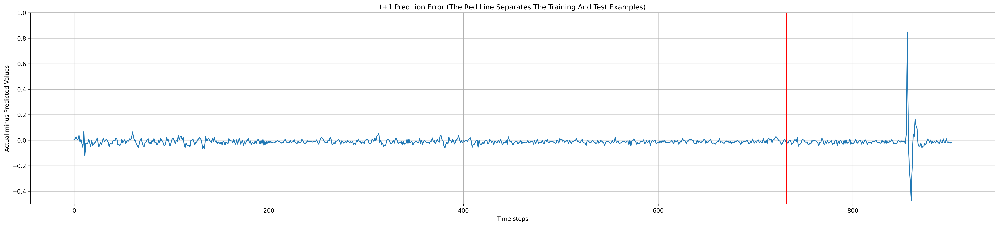

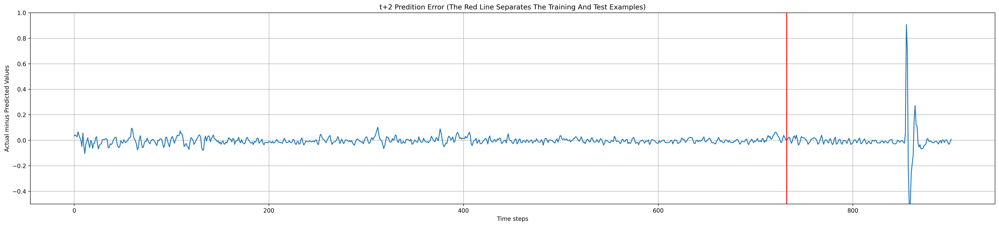

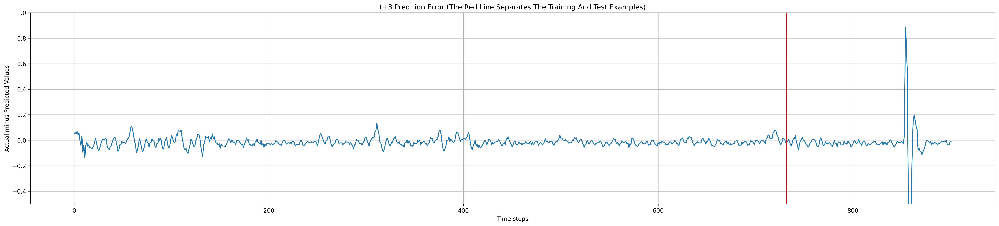

In [ ]:
print ('***** MLP MODEL *****')
train_predict = MLP_model.predict(X)
test_predict = MLP_model.predict(Xt)
plot_error_predict(train_predict, test_predict, y, yt)

***** LSTM MODEL *****
6/6 [==============================] - 0s 3ms/step


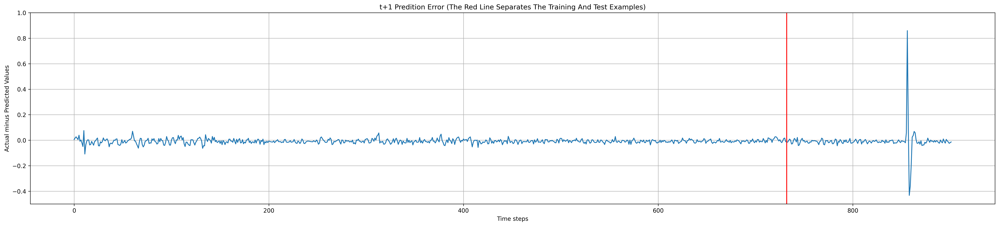

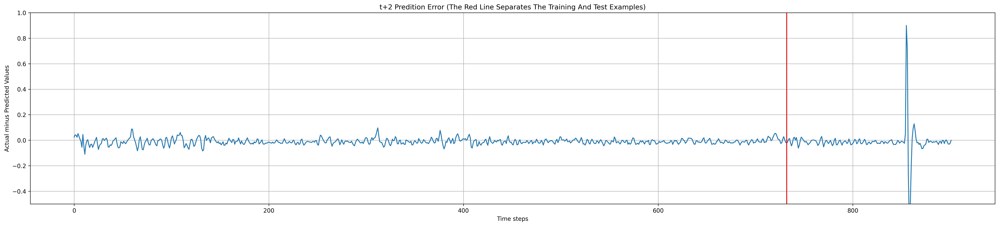

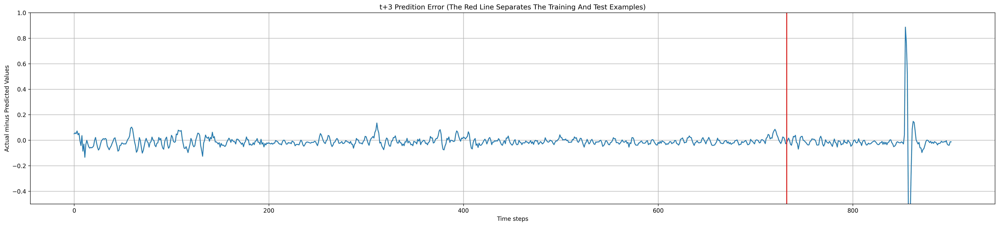

In [ ]:
print ('***** LSTM MODEL *****')
train_predict = LSTM_model.predict(X)
test_predict = LSTM_model.predict(Xt)
plot_error_predict(train_predict, test_predict, y, yt)

## **Exhibit a dataframe with the final results for each predictor**

In [ ]:
DF_results = pd.concat([df1, df2, df3, df4], axis=1, keys=['RNN', 'LINEAR', 'MLP', 'LSTM'])
DF_results.index = ['t+1', 't+2', 't+3']
DF_results

RNN              LINEAR                 MLP                LSTM  \
        train      test     train      test     train      test     train   
t+1  0.018632  0.067951  0.015883  0.076998  0.020856  0.085865  0.018424   
t+2  0.024599  0.094130  0.022425  0.114303  0.023849  0.114466  0.025132   
t+3  0.032681  0.110536  0.029590  0.141454  0.033821  0.141716  0.031930   

               
         test  
t+1  0.082631  
t+2  0.114318  
t+3  0.139001

## **Use the SimpleRNN model to make a search for the best [time_steps].**

In [ ]:
time_steps = [1, 2, 7, 11, 50]
horizon = 3
DF1 = pd.DataFrame()

for timesteps in time_steps:
    X, y, Xt, yt = get_train_test('unemployment_rate.csv', 0.8, timesteps, horizon)
    RNN_model = RNN_predictor(X, y, timesteps)
    train_predict = RNN_model.predict(X)
    test_predict = RNN_model.predict(Xt)
    rmse  = RMSE(train_predict, test_predict)
    rmse.columns = pd.MultiIndex.from_product([[timesteps], rmse.columns])
    DF1 = pd.concat([DF1, rmse], axis=1)

          t-0       t+1       t+2       t+3
0    0.073171  0.105691  0.121951  0.113821
1    0.105691  0.121951  0.113821  0.081301
2    0.121951  0.113821  0.081301  0.089431
3    0.113821  0.081301  0.089431  0.089431
4    0.081301  0.089431  0.089431  0.113821
..        ...       ...       ...       ...
907  0.105691  0.105691  0.105691  0.097561
908  0.105691  0.105691  0.097561  0.097561
909  0.105691  0.097561  0.097561  0.097561
910  0.097561  0.097561  0.097561  0.113821
911  0.097561  0.097561  0.113821  0.105691

[912 rows x 4 columns]
Epoch 1/20
732/732 - 2s - loss: 0.0067 - 2s/epoch - 3ms/step
Epoch 2/20
732/732 - 2s - loss: 8.8202e-04 - 2s/epoch - 2ms/step
Epoch 3/20
732/732 - 1s - loss: 8.7490e-04 - 1s/epoch - 2ms/step
Epoch 4/20
732/732 - 1s - loss: 8.6755e-04 - 1s/epoch - 1ms/step
Epoch 5/20
732/732 - 1s - loss: 8.9149e-04 - 1s/epoch - 2ms/step
Epoch 6/20
732/732 - 1s - loss: 8.9457e-04 - 1s/epoch - 2ms/step
Epoch 7/20
732/732 - 1s - loss: 8.5338e-04 - 1s/epoch - 2ms/st

In [ ]:
DF1.index = ['t+1', 't+2', 't+3']
DF1

1                   2                   7                   11  \
        train      test     train      test     train      test     train   
t+1  0.021065  0.068007  0.018979  0.066737  0.018014  0.066326  0.018041   
t+2  0.027847  0.093755  0.026199  0.091749  0.023609  0.094212  0.023924   
t+3  0.037156  0.109487  0.034039  0.106405  0.030341  0.109652  0.031535   

                     50            
         test     train      test  
t+1  0.067913  0.016699  0.080153  
t+2  0.094581  0.021950  0.108442  
t+3  0.110616  0.028803  0.128237

## **Use the LSTM model to make a search for the best [time_steps].**

In [ ]:
time_steps = [1, 2, 7, 11, 50]
horizon = 3
DF2 = pd.DataFrame()

for timesteps in time_steps:
    X, y, Xt, yt = get_train_test('unemployment_rate.csv', 0.8, timesteps, horizon)
    LSTM_model = LSTM_predictor(X, y, timesteps)
    train_predict = LSTM_model.predict(X)
    test_predict = LSTM_model.predict(Xt)
    rmse  = RMSE(train_predict, test_predict)
    rmse.columns = pd.MultiIndex.from_product([[timesteps], rmse.columns])
    DF2 = pd.concat([DF2, rmse], axis=1)

          t-0       t+1       t+2       t+3
0    0.073171  0.105691  0.121951  0.113821
1    0.105691  0.121951  0.113821  0.081301
2    0.121951  0.113821  0.081301  0.089431
3    0.113821  0.081301  0.089431  0.089431
4    0.081301  0.089431  0.089431  0.113821
..        ...       ...       ...       ...
907  0.105691  0.105691  0.105691  0.097561
908  0.105691  0.105691  0.097561  0.097561
909  0.105691  0.097561  0.097561  0.097561
910  0.097561  0.097561  0.097561  0.113821
911  0.097561  0.097561  0.113821  0.105691

[912 rows x 4 columns]
Epoch 1/200
23/23 - 2s - loss: 0.0622 - 2s/epoch - 90ms/step
Epoch 2/200
23/23 - 0s - loss: 0.0390 - 68ms/epoch - 3ms/step
Epoch 3/200
23/23 - 0s - loss: 0.0222 - 54ms/epoch - 2ms/step
Epoch 4/200
23/23 - 0s - loss: 0.0127 - 55ms/epoch - 2ms/step
Epoch 5/200
23/23 - 0s - loss: 0.0091 - 56ms/epoch - 2ms/step
Epoch 6/200
23/23 - 0s - loss: 0.0084 - 61ms/epoch - 3ms/step
Epoch 7/200
23/23 - 0s - loss: 0.0079 - 59ms/epoch - 3ms/step
Epoch 8/200
23/

In [ ]:
DF2.index = ['t+1', 't+2', 't+3']
DF2

1                   2                   7                   11  \
        train      test     train      test     train      test     train   
t+1  0.017887  0.068175  0.018845  0.069328  0.017821  0.076656  0.016292   
t+2  0.026529  0.096667  0.027210  0.094341  0.023138  0.107054  0.022821   
t+3  0.035658  0.113211  0.036110  0.109766  0.030757  0.130098  0.029849   

                     50            
         test     train      test  
t+1  0.076822  0.014596  0.085267  
t+2  0.110974  0.022124  0.124786  
t+3  0.136869  0.029100  0.151911

(a)	Explique o papel dos parâmetros de projeto [time_steps] e [horizon].

**Resposta:**<BR>
[time_steps]: Refere-se aos períodos (instantes de tempo) em que foram coletadas amostras. Em termos de código irá dizer quantos e quais atrasos no tempo serão usados como dados de entrada no modelo.  

[horizon]: Refere-se a quantos instantes de tempo futuro (forecasting) que serão preditos pelo modelo.

Em resumo: os dados de entrada têm dimensão [time_steps] e os de saída [horizon].

(b)	Qual a diferença no uso do parâmetro [time_steps] no caso dos preditores não-recorrentes e no caso do bloco LSTM?

**Resposta:**<BR>
Para as redes não-recorrentes o parâmetro [time-steps] define a dimensão do vetor de entrada para a rede, ou seja, os dados não formam uma sequência, e são apresentados à rede de uma única vez. Para o bloco LSTM este parâmetro indica o número de elementos da sequência que será fornecida, elemento a elemento (um escalar neste exemplo), para o bloco.

(c)	Qual modelo de predição levou a um melhor desempenho junto aos dados de teste em cada caso?

**Resposta:**<BR>

 Utilizamos a média do RMSE com os dados de teste como critério.

Unemployment_rate: RNN.  

Monthly_sunspot: MLP (um pouco melhor que o Linear)

(d)	Ao se variar o [horizon], apresente uma hipótese para a perda de desempenho conforme [horizon] cresce de 1 até 3, comportamento produzido por todos os modelos de predição, nos dois casos de estudo.

**Resposta:**<BR>

 Propagação de erros de previsão: à medida que se expande o horizonte de previsão, erros associados às previsões anteriores se propagam num efeito de amplificação do erro, de tal forma que quanto mais distante estamos do instante de tempo dos dados, maior será o erro, isto é:

RMSE(t+n)>RMSE(t+n-1)>...>RMSE(t+1)

(e)	Ao se variar o [time_steps] especificamente para os modelos SimpleRNN e LSTM, procure explicar o comportamento observado em cada caso de estudo.

**Resposta:**<BR>

A diferença está associada ao comportamento de cada série temporal. A série monthly_sunspot tem um comportamento aproximadamente cíclico, de frequência uniforme, com pequenas variações nos tempos mais curtos. Os dados de teste têm características muito parecidas com os dados de treino. Estas características levaram às redes com blocos recorrentes ter maior capacidade preditiva com um período maior de observação.

A série unemployment_rate tem características mais desafiadoras. Existe ciclicidade, mas de frequência variável. Outra dificuldade associada à esta série é a anomalia associada ao período de pandemia, quando existe uma variação muito grande nos valores usualmente observados. Estes outliers não podem ser previstos, mas o erro de previsão é menor quando o modelo se apoia nos dados mais recentes. É este efeito da pandemia que leva a termos erros menores nos dados de teste quando o período de observação é menor.